# Useful image processing libraries in Python 

In [1]:
import numpy as np
from scipy import misc
from scipy.ndimage import affine_transform, zoom

In [2]:
from skimage import io, img_as_ubyte, img_as_float
from skimage.transform import rescale
from skimage.color import rgb2lab, lab2rgb, rgba2rgb
from skimage.io import imread, imsave, imshow, show, imshow_collection, imread_collection
from skimage import color, exposure, data
from skimage.util import invert, random_noise, montage
from skimage.transform import SimilarityTransform, warp, swirl

In [3]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [4]:
from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract, multiply, difference, screen
import PIL.ImageStat as stat

In [5]:
import imageio

# Read in images and display

In [6]:
img1 = io.imread("data/lab_basics_examples_images/girl.tif")
img2 = io.imread("data/lab_basics_examples_images/boy.tif")
img3_rgb = io.imread("data/lab_basics_examples_images/lenna-RGB.tif")
img3_gray = io.imread("data/lab_basics_examples_images/lenna-RGB.tif", as_gray=True)
img4 = io.imread('data/lab_basics_examples_images/chronometer.tif')

### Display an image

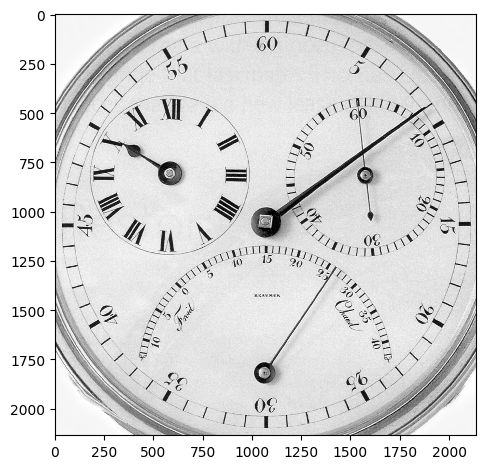

In [7]:
io.imshow(img4, cmap=plt.cm.gray)
plt.show()

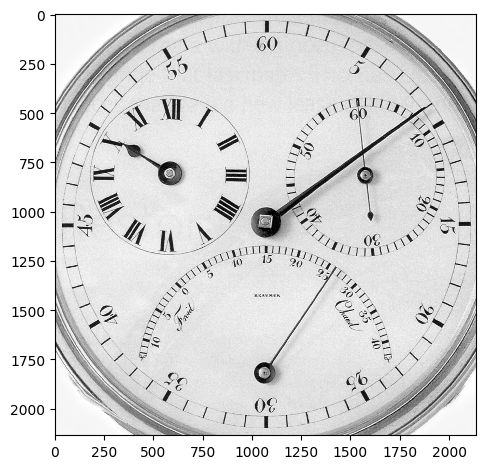

In [8]:
imshow(img4)

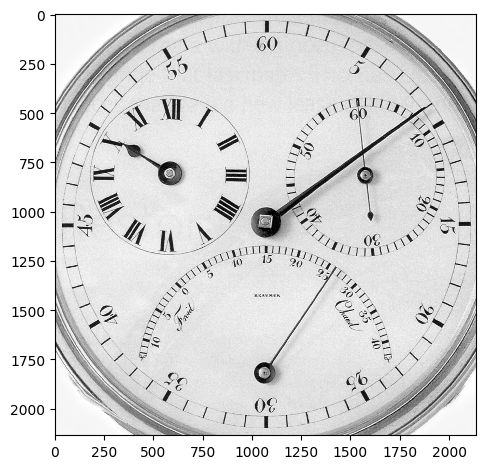

In [9]:
imshow(img4)
plt.show()

### Rescale an image

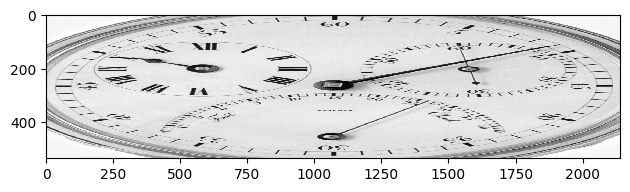

In [10]:
img4_rescaled = rescale(img4, 0.25, channel_axis=-1)
io.imshow(img4_rescaled, cmap='gray')
plt.show()

In [11]:
img4.shape

(2136, 2140)

In [12]:
img4_rescaled.shape

(534, 2140)

In [13]:
img4.dtype

dtype('uint8')

In [14]:
img4_rescaled.dtype

dtype('float64')

### Save an image

In [15]:
img4_rescaled = img_as_ubyte(img4_rescaled)

In [16]:
img4_rescaled.dtype

dtype('uint8')

In [17]:
io.imsave('data/lab_basics_examples_images/chronometer_rescaled.png', img4_rescaled)

### Display images in rows and columns

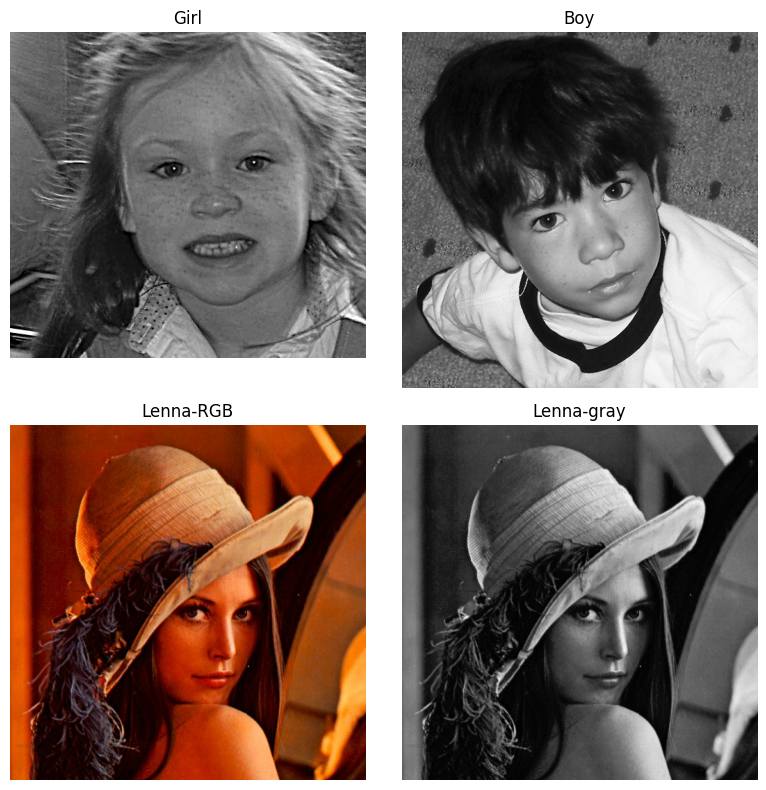

In [18]:
fig,axes = plt.subplots(nrows=2, ncols=2, figsize=(8,8), sharex=True, sharey=True)
ax=axes.ravel()
ax[0].imshow(img1, cmap=plt.cm.gray)
ax[0].set_title('Girl')

ax[1].imshow(img2, cmap='gray')
ax[1].set_title('Boy')

ax[2].imshow(img3_rgb)
ax[2].set_title('Lenna-RGB')

ax[3].imshow(img3_gray, cmap=plt.cm.gray)
ax[3].set_title('Lenna-gray')

for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

In [19]:
np.max(img3_rgb)

255

Converting between RGB color space and Lab color space

In [20]:
img3_lab = rgb2lab(img3_rgb)

In [21]:
img3_lab.shape

(512, 512, 3)

img3_lab[...,0] = max(img3_lab[...,0]) - img3_lab[...,0]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


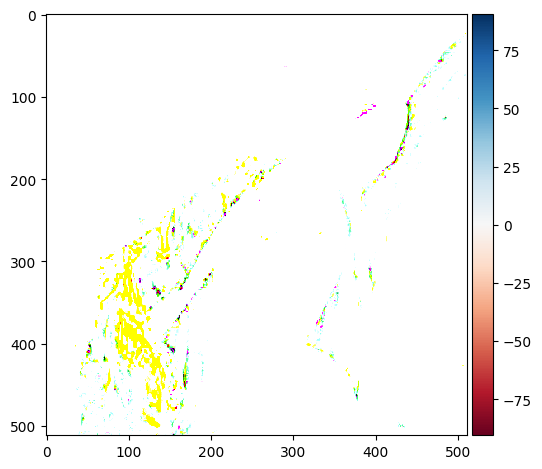

In [22]:
io.imshow(img3_lab)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


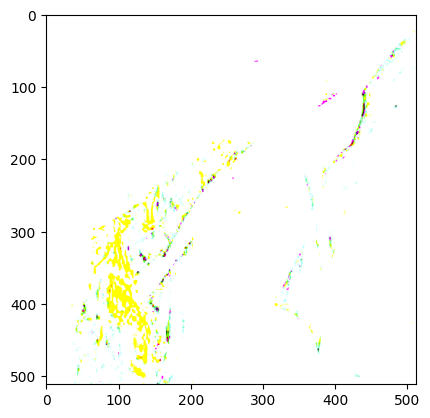

In [23]:
plt.imshow(img3_lab)

In [24]:
img3_lab_rgb = lab2rgb(img3_lab)

In [25]:
im = io.imread("data/lab_basics_examples_images/sunflower.tif")

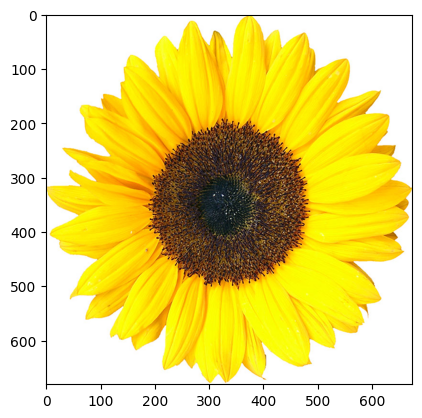

In [26]:
plt.imshow(im)

In [27]:
im_lab=rgb2lab(im)

In [28]:
im_lab[...,1]=im_lab[...,2]=0

In [29]:
im_rgb=lab2rgb(im_lab)

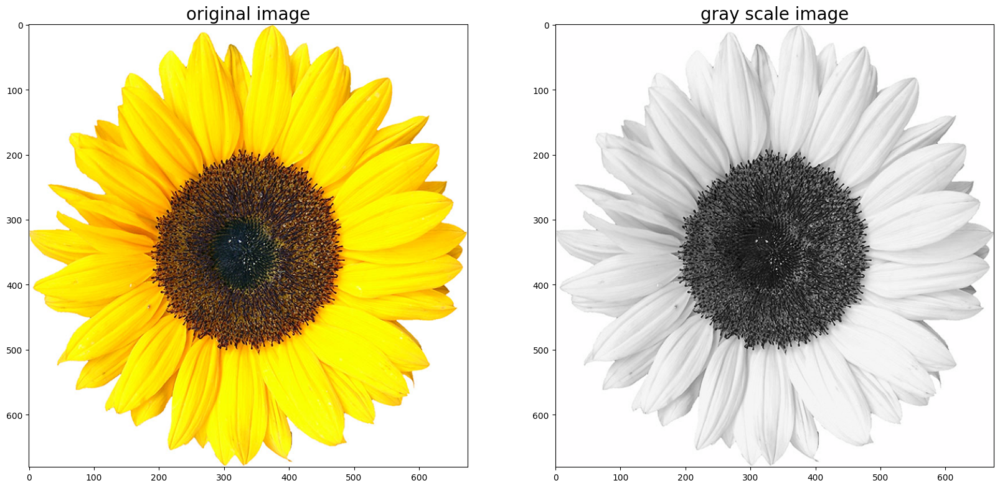

In [30]:
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(im),plt.axis('on'),
plt.title('original image',size=20)
plt.subplot(122), plt.imshow(im_rgb), plt.axis('on'), plt.title('gray scale image',size=20)
plt.show()

Changing the intensity (0 channel in Lab space) only

/tmp/ipykernel_1291/337391480.py:6: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 34450 negative Z values that have been clipped to zero
  im_rgb2=lab2rgb(im_lab)


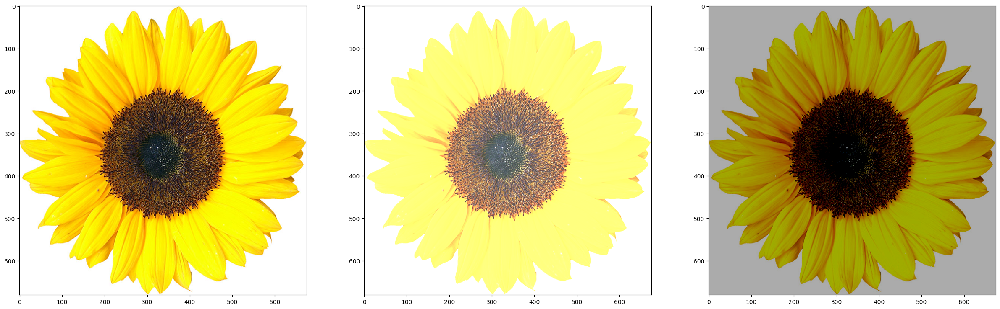

In [31]:
im_lab = rgb2lab(im)
im_lab[...,0]=im_lab[...,0]+30
im_rgb1=lab2rgb(im_lab)
im_lab = rgb2lab(im)
im_lab[...,0]=im_lab[...,0]-30
im_rgb2=lab2rgb(im_lab)
plt.figure(figsize=(30,10))
plt.subplot(131),plt.imshow(im)
plt.subplot(132),plt.imshow(im_rgb1)
plt.subplot(133),plt.imshow(im_rgb2)
plt.show()

Inverting the intensity -- equivalent to image negative

/tmp/ipykernel_1291/2384715632.py:3: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 231793 negative Z values that have been clipped to zero
  im_rgb1=lab2rgb(im_lab)


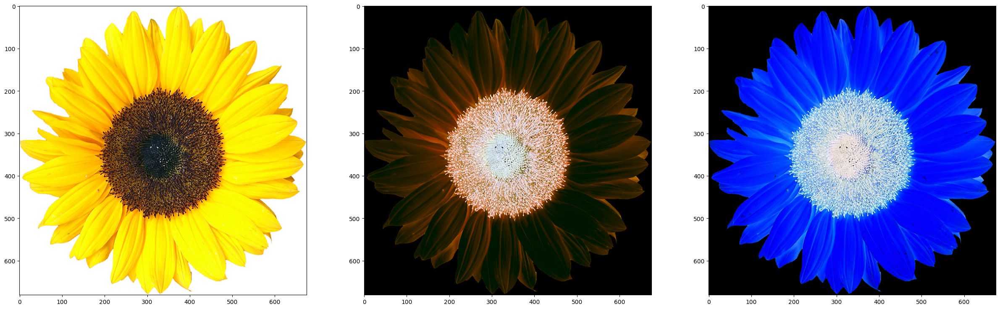

In [32]:
im_lab = rgb2lab(im)
im_lab[...,0]=np.max(im_lab[...,0])-im_lab[...,0]
im_rgb1=lab2rgb(im_lab)
im_rgb2=np.max(im)-im
plt.figure(figsize=(30,10))
plt.subplot(131),plt.imshow(im)
plt.subplot(132),plt.imshow(im_rgb1)
plt.subplot(133),plt.imshow(im_rgb2)
plt.show()

## Using PIL function open() reads an image in an Image object 

The image is loaded as an object of the PIL.PngImagePlugin.PngImageFile class, and we can use properties such as the width, height, and mode to find the size (width x height in pixels or the resolution of the image) and mode of the image:

In [33]:
im_sun=Image.open("data/lab_basics_examples_images/sunflower.tif") #read an image, provide the correct path
print(im_sun.width, im_sun.height, im_sun.mode, im_sun.format, type(im_sun))

675 681 RGB TIFF <class 'PIL.TiffImagePlugin.TiffImageFile'>


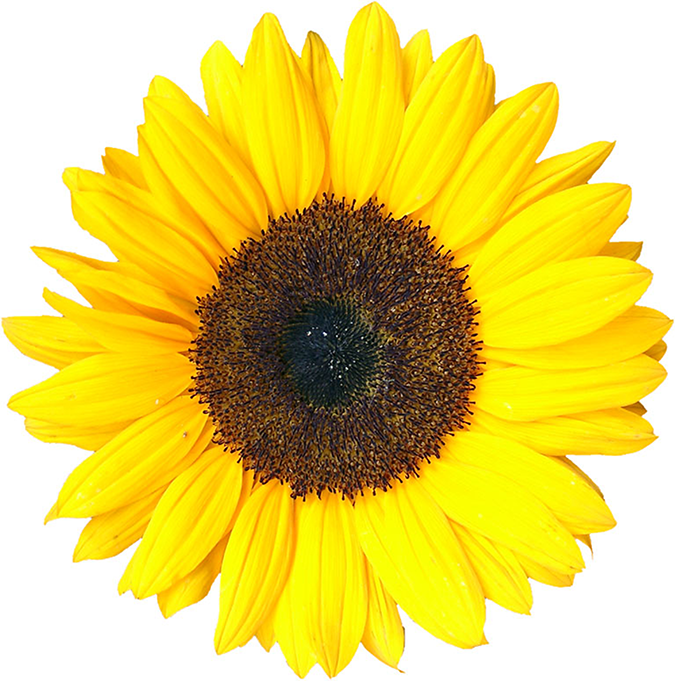

In [34]:
im_sun.show() #display the image in a pop-up window

The following code block shows how to use the PIL function, convert(), to convert the colored RGB image into a grayscale image:

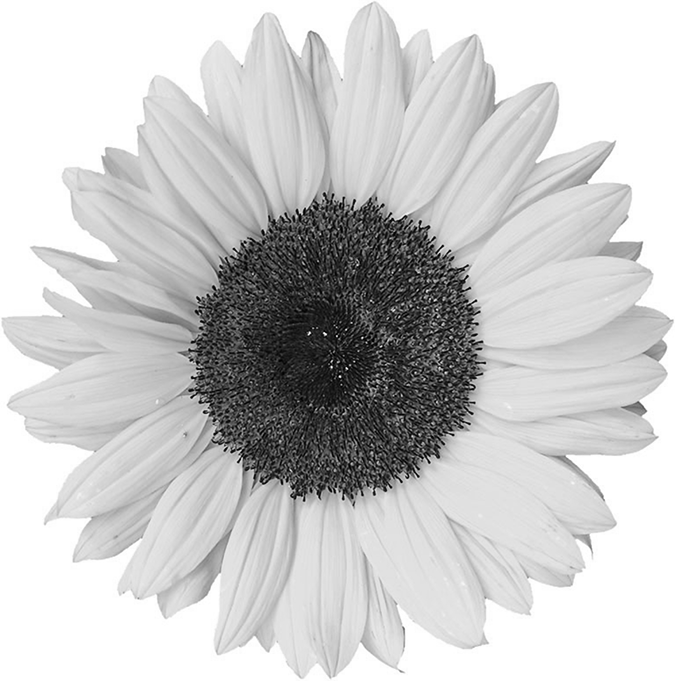

In [35]:
im_sun_g = im_sun.convert('L') #convert the RGB color image to a grayscale image 
im_sun_g.save("data/lab_basics_examples_images/sunflower_g.png")#save the grayscale image
Image.open('data/lab_basics_examples_images/sunflower_g.png').show()#read the grayscale image and show

## Reading, saving, and displaying an image using Matplotlib

(750, 1000, 4) float32 <class 'numpy.ndarray'>


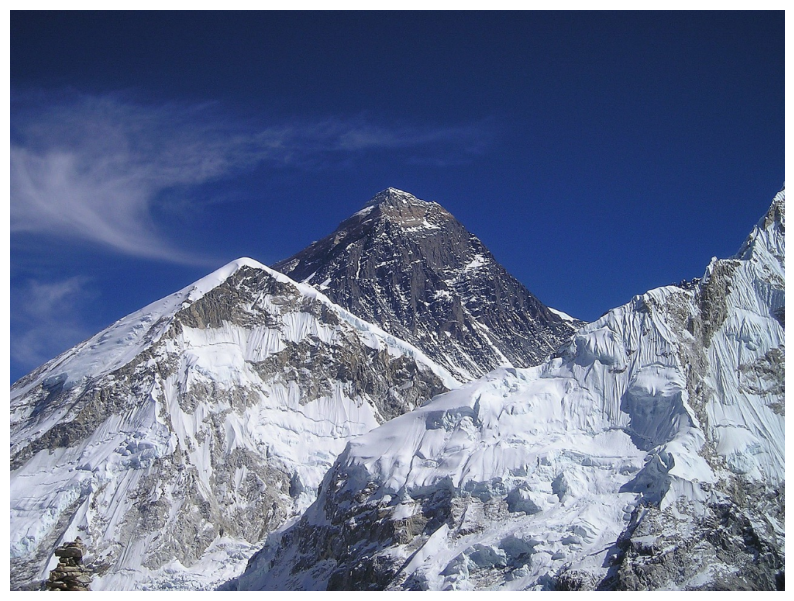

In [36]:
im = mpimg.imread("data/lab_basics_examples_images/hill.png") # read the image from disk as a numpy ndarray
print(im.shape, im.dtype, type(im))
# this image contains an α channel, hence num_channels= 4
# (960, 1280, 4) float32 <class 'numpy.ndarray'>
plt.figure(figsize=(10,10))
plt.imshow(im) # display the image
plt.axis('off')
plt.show()

The next code snippet changes the image to a darker image by first setting all of the pixel values below 0.5 to 0 and then saving the numpy ndarray to disk. The saved image is again reloaded and displayed:

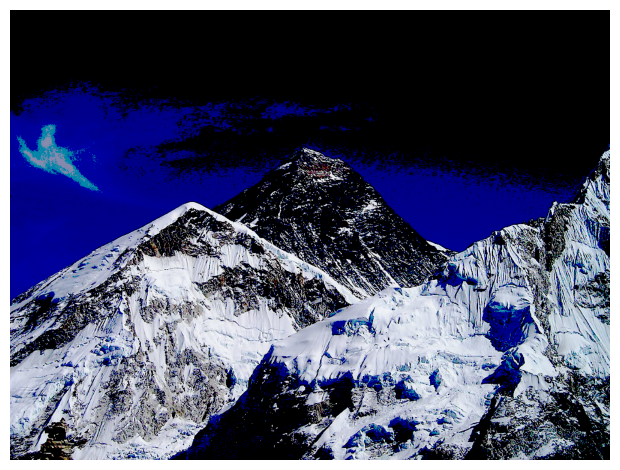

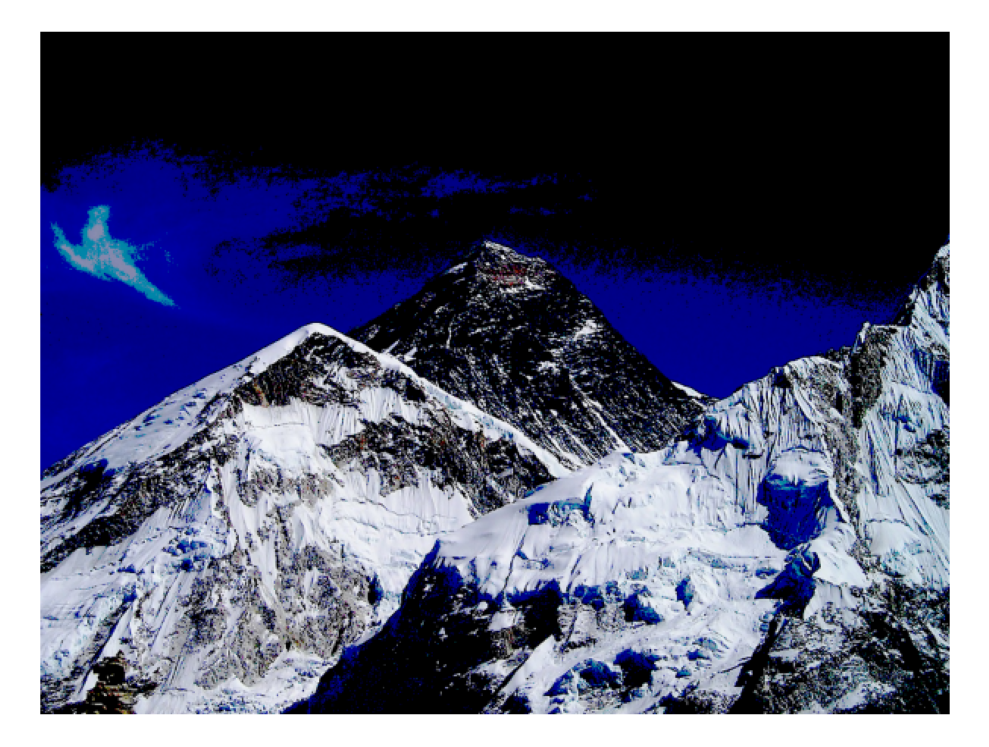

In [37]:
im1 = im
# make the image look darker
im1[im1 < 0.5] = 0
plt.imshow(im1)
plt.axis('off')
plt.tight_layout()
plt.savefig("data/lab_basics_examples_images/hill_dark.png")  # save the dark image
im = mpimg.imread("data/lab_basics_examples_images/hill_dark.png") # read the dark image
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.axis('off') # no axis ticks
plt.tight_layout()
plt.show()

## Reading, saving, and displaying an image using scikit-image

The next code block uses the imread() function from scikit-image to read an image in a numpy ndarray of type uint8 (8-bit unsigned integer). Hence, the pixel values will be in between 0 and 255. Then it converts (changes the image type or mode, which will be discussed shortly) the colored RGB image into an HSV image using the hsv2rgb() function from the Image.color module. Next, it changes the saturation (colorfulness) to a constant value for all of the pixels by keeping the hue and value channels unchanged. The image is then converted back into RGB mode with the rgb2hsv() function to create a new image, which is then saved and displayed:

(340, 453, 3) uint8 <class 'numpy.ndarray'>


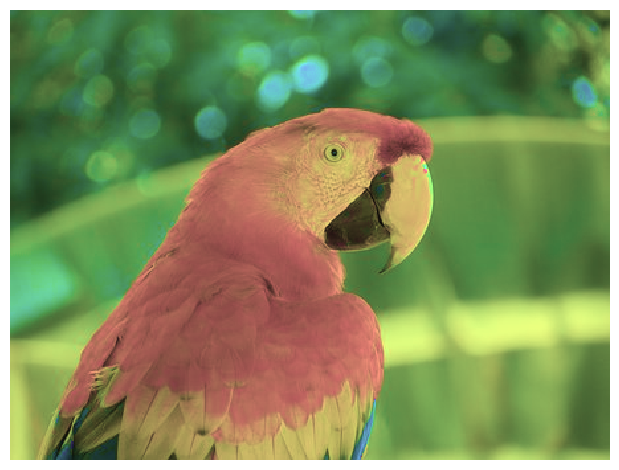

((0.0, 1.0, 0.0, 1.0), <matplotlib.image.AxesImage at 0x7f104fd6a710>, None)

In [38]:
#im = imread("data/lab_basics_examples_images/parrot.png") 
#im = rgba2rgb(im)
#imsave("data/lab_basics_examples_images/parrot.png",im)
# read image from disk, provide the correct path
im = imread("data/lab_basics_examples_images/parrot.png") 
print(im.shape, im.dtype, type(im))
# (362, 486, 3) uint8 <class 'numpy.ndarray'>
hsv = color.rgb2hsv(im) # from RGB to HSV color space
hsv[:, :, 1] = 0.5 # change the saturation
im1 = color.hsv2rgb(hsv) # from HSV back to RGB
#imsave('data/lab_basics_examples_images/parrot_hsv.png', im1) # save image to disk
im = imread("data/lab_basics_examples_images/parrot_hsv.png")
plt.axis('off'), imshow(im), show()

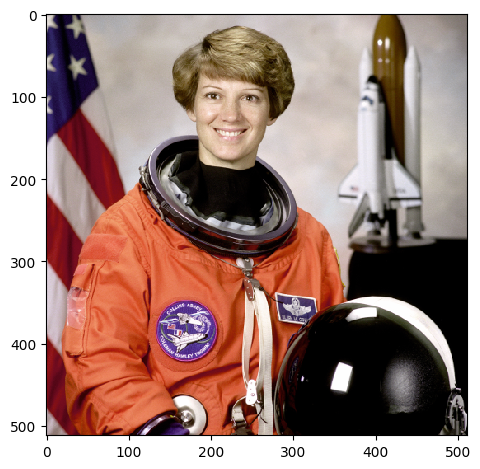

(<matplotlib.image.AxesImage at 0x7f104fea68f0>, None)

In [39]:
astronaut = data.astronaut()
imshow(astronaut), show()

/tmp/ipykernel_1291/707828519.py:1: DeprecationWarning: scipy.misc.face has been deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. Dataset methods have moved into the scipy.datasets module. Use scipy.datasets.face instead.
  face = misc.face()


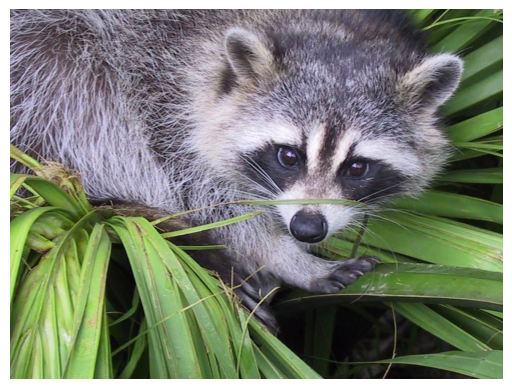

(<matplotlib.image.AxesImage at 0x7f104fd6b040>,
 (-0.5, 1023.5, 767.5, -0.5),
 None)

In [40]:
face = misc.face()
plt.imsave('data/lab_basics_examples_images/face.png',face)
plt.imshow(face),plt.axis('off'),plt.show()

/tmp/ipykernel_1291/1045509105.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  face = imageio.imread('data/lab_basics_examples_images/face.png')


<class 'numpy.ndarray'> (768, 1024, 4) uint8


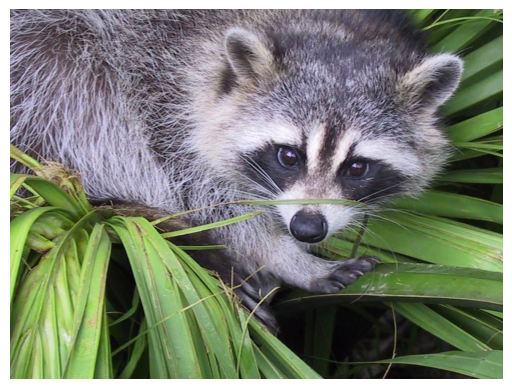

(<matplotlib.image.AxesImage at 0x7f104fdc4df0>,
 (-0.5, 1023.5, 767.5, -0.5),
 None)

In [41]:
face = imageio.imread('data/lab_basics_examples_images/face.png')
print(type(face),face.shape,face.dtype)
plt.imshow(face),plt.axis('off'),plt.show()

# Dealing with different image types and file formats

Some popular file formats: BMP (8-bit, 24-bit, 32-bit), PNG, JPG(JPEG), GIF, PPM, and TIFF. Python image processing libraries read the image and extract the data, along with some other useful information, for example, image size, type/mode, and data type.

Converting from one file format to another: Using PIL, we can read an image in one file format and save it to another

In [42]:
im = Image.open("data/lab_basics_examples_images/parrot.png")
print(im.mode)
im.save("data/lab_basics_examples_images/parrot.jpg")

RGB


In [43]:
im = Image.open("data/lab_basics_examples_images/hill.png")
print(im.mode)
# RGBA
im.convert('RGB').save("data/lab_basics_examples_images/hill.jpg") # first convert to RGB mode

RGBA


# Image types (modes)

An image can be of the following different types: 
    Single channel images — each pixel is represented by a single value: 
        Binary (monochrome) images (each pixel is represented by a single 0-1 bit)
        Gray-level images (each pixel can be represented with 8-bits and can have values typically in the range of 0-255)
    Multi-channel images—each pixel is represented by a tuple of values: 
        3-channel images; for example, the following: 
            RGB images — each pixel is represented by three-tuple (r, g, b) values, representing red, green, and
blue channel color values for every pixel.
            HSV images — each pixel is represented by three-tuple (h, s, v) values, representing hue (color),
saturation (colorfulness — how much the color is mixed with white), and value (brightness — how much the color is mixed with black) channel color values for every pixel. The HSV model describes colors in a similar manner to how the human eye tends to perceive colors.
        Four-channel images; for example, RGBA images — each pixel is represented by four-tuple (r, g, b, α) values, the last channel representing the transparency.

Note that we can lose some information while converting into grayscale for some colored images. The following code shows such an example with Ishihara plates, used to detect color-blindness. This time, the rgb2gray() function is used from the color module, and both the color and the grayscale images are shown side by side. As can be seen in the following figure, the number 8 is almost invisible in the grayscale version:

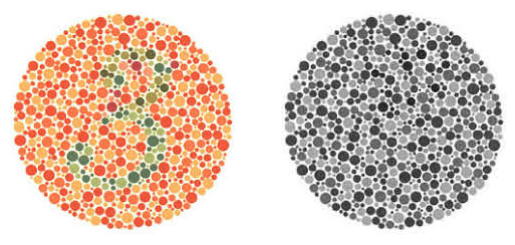

In [44]:
im = imread("data/lab_basics_examples_images/Ishihara_8.jpeg")
im_g = color.rgb2gray(im)
plt.subplot(121), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.subplot(122), plt.imshow(im_g, cmap='gray'), plt.axis('off')
plt.show()

# Some color spaces (channels)

The following represents a few popular channels/color spaces for an image: RGB, HSV, XYZ, YUV, YIQ, YPbPr, YCbCr, and YDbDr.

We can convert from one color space into another using library functions; for example, the following code converts an RGB color space into an HSV color space image:

<Figure size 640x480 with 0 Axes>

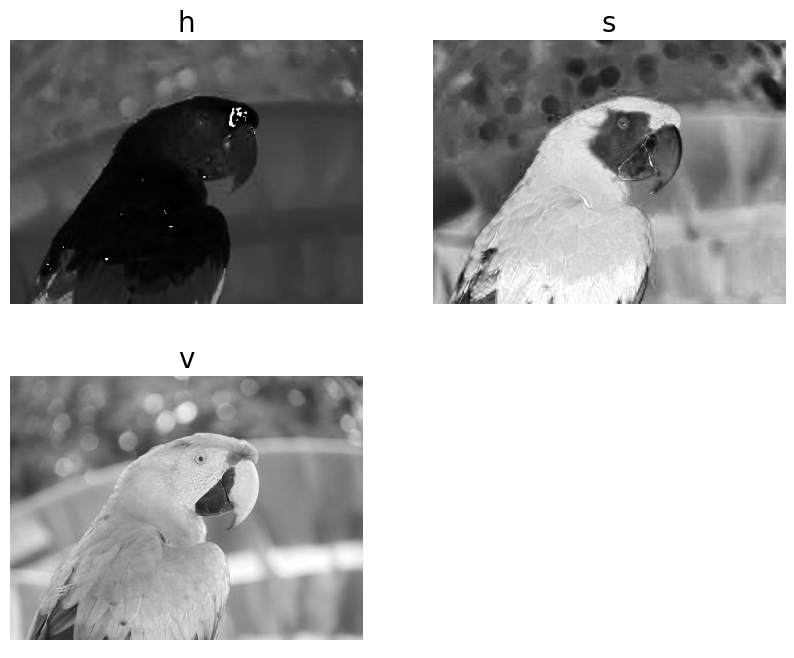

In [45]:
im = imread("data/lab_basics_examples_images/parrot.png")
im_hsv = color.rgb2hsv(im)
plt.gray()
plt.figure(figsize=(10,8))
plt.subplot(221), plt.imshow(im_hsv[...,0]), plt.title('h', size=20),
plt.axis('off')
plt.subplot(222), plt.imshow(im_hsv[...,1]), plt.title('s', size=20),
plt.axis('off')
plt.subplot(223), plt.imshow(im_hsv[...,2]), plt.title('v', size=20),
plt.axis('off')
plt.subplot(224), plt.axis('off')
plt.show()